In [1]:
### Make notebook wider:

from IPython.display import display, HTML

display(HTML(data="""
<style>
    div#notebook-container    { width: 95%; }
    div#menubar-container     { width: 65%; }
    div#maintoolbar-container { width: 99%; }
</style>
"""))

In [2]:
# load in bens synthetic data: 
# check it is okay
# make it into PPseq output 
# run PPSeq on it 
    
    
    
#### save out data for standard
## make all the other data types and save them out
### start this running with PPseq - check it it working 
### do this for all the other mice. 
### remake these plots. done 

#etc. 

In [3]:
import os
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle
import pandas as pd
import pickle
import json

def save_params_as_json(args, save_path, file_name):
    config_filename = os.path.join(save_path, file_name)
    if not os.path.exists(save_path):
        os.makedirs(save_path)
    with open(config_filename, 'w') as config_file:
        json.dump(args, config_file, indent=4)
    return(config_filename)

def create_spike_time_vectors(spike_times,clusters):
    spiketimevectors = []
    for i in np.unique(clusters):
        spiketimevectors = spiketimevectors + [spike_times[np.where(clusters==i)[0]]]
    return spiketimevectors

def write_text_file(spikes, filename="spike_data.txt"):
    f = open(filename, "w")
    for i, spike_train in enumerate(spikes):
        for t, spike_time in enumerate(spike_train):
            mssg = "{:.1f}\t{:10.4f}\n".format(i + 1, spike_time)
            f.write(mssg)
    f.close()
    return filename


def plot_synthetic_spike_data(spikes_df,event_periods,x1,x2,mouse_session_recording):

    # for loading color and order data from awake alignment 
    region = 'striatum'
    saved_data_path = os.path.join("Z:\projects\sequence_squad\organised_data\ppseq_analysis\ppseq_awake_analysis\plots\\" + mouse_session_recording, region) + '\\'

    with open(os.path.join(os.path.join(PP_PATH,file) + r"\analysis_output\reordered_recolored\colors"), "rb") as input_file:
        colors = pickle.load(input_file)

    with open(os.path.join(os.path.join(PP_PATH,file) + r"\analysis_output\reordered_recolored\neuron_index"), "rb") as input_file:
        new_neuron_index = pickle.load(input_file)

    # load in events
    ########## adapted from bens code: I think it orders the seq types by their spike times ordering
    brain_state = "awake" # name of prepare_data file output 
    recording_dir_awake = "Z:/projects/sequence_squad/organised_data/ppseq_data/finalised_output/striatum/" + brain_state + "/" 
    for item in os.listdir(recording_dir_awake):
        if mouse_session_recording in item:
            mouse_dat_file = item
    recording_dir_awake= recording_dir_awake + mouse_dat_file

    prepared_spikes_dir = os.path.join(recording_dir_awake,"trainingData/" + mouse_session_recording)
    spike_file = os.path.join(prepared_spikes_dir + ".txt")
    spike_json_file = os.path.join(recording_dir_awake,"trainingData/params_"+mouse_session_recording+".json")

    spike_json = json.load(open(spike_json_file))

    print(spike_json["time_span"])
    time_spans = spike_json["time_span"]

    ppseq_events = pd.read_pickle("Z:/projects/sequence_squad/organised_data/ppseq_analysis/synthetic_data/"+mouse_session_recording+"/striatum/all_extracted_spike_profiles")
    if event_periods == None:
        event_periods = np.zeros((len(ppseq_events),2))
        for event in range(len(ppseq_events)):
            event_periods[event,0] = ppseq_events["spike_profiles"][event].timestamp.min()
            event_periods[event,1] = ppseq_events["spike_profiles"][event].timestamp.max()
        event_sorted_idx = np.argsort(event_periods, 0)[:,0]
        event_periods = np.sort(event_periods, 0)
        event_periods = event_periods + time_spans[0][0]
        ppseq_events = ppseq_events.loc[event_sorted_idx] # sorted according to time periods
        ppseq_events.reset_index(inplace=True) # sorted according to time periods
    seq_types = ppseq_events.seq_type.values
    ###################

    new_neuron_permute_loc = np.zeros(len(new_neuron_index))
    for i in range(len(new_neuron_index)):
        new_neuron_permute_loc[i] = int(list(new_neuron_index).index(i))

    fig,ax= plt.subplots(1, 1,figsize=(40, 2.5))

    neuron_order_test = new_neuron_permute_loc[spikes_df.neuron.values.astype(int)-1]
    ax.scatter(spikes_df.timestamp.values, neuron_order_test ,marker = 'o', s=10, linewidth=0,color = 'black' ,alpha=0.7)

    rects = []
    for i,event in enumerate(event_periods):
        seq_type = seq_types[i]
        left = min(event)
        right = max(event)
        top = max(spikes_df.neuron)
        bottom = min(spikes_df.neuron)
        col_ = colors[int(seq_type)]
        rects +=  [Rectangle((left, bottom), right-left, top-bottom, linewidth=1, edgecolor=col_, facecolor='none') ]

    for rect in rects:
        ax.add_patch(rect)

    ax.set_xlim([min(spikes_df.timestamp) + x1,min(spikes_df.timestamp) + x2])
    
    return ppseq_events, spikes_df, event_periods
    
def save_out_synthetic_data(synthetic_file_type,synthetic_file_name,ppseq_events, spikes_df, event_periods,mouse_session_recording):

    if synthetic_file_type == synthetic_file_name:
        out_path = r"Z:\projects\Emmett\synthetic_data_rerun\synthetic_spikes\\" + mouse_session_recording + r'\\'+ synthetic_file_type +'\\'
    else:
        out_path = r"Z:\projects\Emmett\synthetic_data_rerun\synthetic_spikes\\" + mouse_session_recording + r'\\'+ synthetic_file_type +'\\' + synthetic_file_name + '\\'
    if not os.path.isdir(out_path):
        os.makedirs(out_path)

    # save out events data 
    ppseq_events.to_pickle(out_path  + 'ppseq_events.pkl')
    # save out spikes data 
    spikes_df.to_pickle(out_path  + 'spikes_df.pkl')
    # save out event periods
    np.save(out_path + 'event_periods.npy', event_periods)

    # save out txt explaining each one...
    data = """ - Ppseq_events.pkl is a data frame containing each inserted set of spikes (as a df called spike profiles), the neuron order for these and the motif type

     - Spikes_df.pkl are all the spikes, both the inserted ones and the background

     - Event_periods.npy contains the start and end points for each inserted spike motif"""
    # Open the file in write mode ('w')
    with open(out_path + 'file_instructions.txt', 'w') as txt_file:
        # Write the data to the file
        txt_file.write(data)

    ##################### save out prepared data for ppseq run:
    prep_dat_path = 'Z:\projects\Emmett\synthetic_data_rerun\prepared_data\\' + mouse_session_recording + '\\' 
    ## save out instertion data 
    if not os.path.isdir(prep_dat_path):
        os.makedirs(prep_dat_path)

    # load in events
    ########## adapted from bens code: I think it orders the seq types by their spike times ordering
    brain_state = "awake" # name of prepare_data file output 
    recording_dir_awake = "Z:/projects/sequence_squad/organised_data/ppseq_data/finalised_output/striatum/" + brain_state + "/" 
    for item in os.listdir(recording_dir_awake):
        if mouse_session_recording in item:
            mouse_dat_file = item
    recording_dir_awake= recording_dir_awake + mouse_dat_file
    spike_json_file = os.path.join(recording_dir_awake,"trainingData/params_"+mouse_session_recording+".json")
    spike_json = json.load(open(spike_json_file))
    print(spike_json["time_span"])
    time_spans = spike_json["time_span"]
    
    
    behav_time_interval_start = time_spans[0][0]
    N_neurons = len(np.unique(spikes_df.neuron.values))

    json_ = {'full_path_to_data': out_path,
     'mouse_implant_recording': mouse_session_recording,
     'output_filename': mouse_session_recording + '_' + synthetic_file_name,
     'save_path': prep_dat_path,
     'time_span': time_spans,
     'single_or_multiunits': 'both',
     'region': 'striatum',
     'use_emmett_curation': False,
     'max_firing_rate': 15.0,
     'align_to_zero': True,
     'shuffle': 'None',
     'visualise': True,
     'min_fano_factor': 0.5,
     'max_fano_factor': 12,
     'number_of_neurons':N_neurons }

    params_filename= save_params_as_json(json_, json_["save_path"], "params_"+json_["output_filename"]+".json")

    # rebase back to zero
    reabsed_spike_times = spikes_df.timestamp.values - time_spans[0][0]
    spike_times = create_spike_time_vectors(reabsed_spike_times,spikes_df.neuron.values)

    data_filename = write_text_file(spikes=spike_times, filename= json_["save_path"] + json_["output_filename"]+".txt") 

    print(f"    • data '.txt' file saved to:          {data_filename}")
    print(f"    • parameters '.json' file saved to:   {params_filename}")
    
def permute_spikes_except_holdout(data_frame, holdout_periods):
    # Create a mask to identify data within holdout periods
    holdout_mask = np.zeros(len(data_frame), dtype=bool)
    for period in holdout_periods:
        start_time, end_time = period
#         THIS IS WRONG!
#         holdout_mask |= (data_frame['timestamp'] >= start_time) & (data_frame['timestamp'] <= end_time)

    # Get the neuron IDs outside holdout periods
    neuron_ids_outside_holdout = data_frame.loc[~holdout_mask, 'neuron'].tolist()

    # Shuffle the neuron IDs outside holdout periods
    shuffled_neuron_ids = np.random.permutation(neuron_ids_outside_holdout)

    # Update the DataFrame with shuffled neuron IDs outside holdout periods
    data_frame.loc[~holdout_mask, 'neuron'] = shuffled_neuron_ids

    return data_frame

def plot_synthetic_spike_data_ifbroken(spikes_df,event_periods,x1,x2,mouse_session_recording):

    js_file = r"Z:\projects\Benjamin\synthetic_analysis\\" + mouse_session_recording + "\synth_spikes\spike_synth.json"
    spikes_df = pd.read_pickle(js_file)
    new_column_names = {0: 'neuron', 1: 'timestamp'}
    spikes_df.rename(columns=new_column_names, inplace=True)

    # for loading color and order data from awake alignment 
    region = 'striatum'
    saved_data_path = os.path.join("Z:\projects\sequence_squad\organised_data\ppseq_analysis\ppseq_awake_analysis\plots\\" + mouse_session_recording, region) + '\\'

    with open(os.path.join(os.path.join(PP_PATH,file) + r"\analysis_output\reordered_recolored\colors"), "rb") as input_file:
        colors = pickle.load(input_file)

    with open(os.path.join(os.path.join(PP_PATH,file) + r"\analysis_output\reordered_recolored\neuron_index"), "rb") as input_file:
        new_neuron_index = pickle.load(input_file)

    # load in events
    ########## adapted from bens code: I think it orders the seq types by their spike times ordering
    brain_state = "awake" # name of prepare_data file output 
    recording_dir_awake = "Z:/projects/sequence_squad/organised_data/ppseq_data/finalised_output/striatum/" + brain_state + "/" 
    for item in os.listdir(recording_dir_awake):
        if mouse_session_recording in item:
            mouse_dat_file = item
    recording_dir_awake= recording_dir_awake + mouse_dat_file

    prepared_spikes_dir = os.path.join(recording_dir_awake,"trainingData/" + mouse_session_recording)
    spike_file = os.path.join(prepared_spikes_dir + ".txt")
    spike_json_file = os.path.join(recording_dir_awake,"trainingData/params_"+mouse_session_recording+".json")

    spike_json = json.load(open(spike_json_file))

    print(spike_json["time_span"])
    time_spans = spike_json["time_span"]

    ppseq_events = pd.read_pickle("Z:/projects/sequence_squad/organised_data/ppseq_analysis/synthetic_data/"+mouse_session_recording+"/striatum/all_extracted_spike_profiles")
    if event_periods == None:
        event_periods = np.zeros((len(ppseq_events),2))
        for event in range(len(ppseq_events)):
            event_periods[event,0] = ppseq_events["spike_profiles"][event].timestamp.min()
            event_periods[event,1] = ppseq_events["spike_profiles"][event].timestamp.max()
        event_sorted_idx = np.argsort(event_periods, 0)[:,0]
        event_periods = np.sort(event_periods, 0)
        event_periods = event_periods + time_spans[0][0]
        ppseq_events = ppseq_events.loc[event_sorted_idx] # sorted according to time periods
        ppseq_events.reset_index(inplace=True) # sorted according to time periods
    seq_types = ppseq_events.seq_type.values
    ###################

    # flip over spikes
    for period in event_periods:
        mask = (spikes_df['timestamp'] >= period[0]) & (spikes_df['timestamp'] <= period[-1])
        revered_timestamps = period[0] + (period[-1] - spikes_df[mask].timestamp.values)
        spikes_df.loc[mask, 'timestamp'] = revered_timestamps

    new_neuron_permute_loc = np.zeros(len(new_neuron_index))
    for i in range(len(new_neuron_index)):
        new_neuron_permute_loc[i] = int(list(new_neuron_index).index(i))

    fig,ax= plt.subplots(1, 1,figsize=(40, 2.5))

    neuron_order_test = new_neuron_permute_loc[spikes_df.neuron.values.astype(int)-1]
    ax.scatter(spikes_df.timestamp.values, neuron_order_test ,marker = 'o', s=10, linewidth=0,color = 'black' ,alpha=0.7)

    rects = []
    for i,event in enumerate(event_periods):
        seq_type = seq_types[i]
        left = min(event)
        right = max(event)
        top = max(spikes_df.neuron)
        bottom = min(spikes_df.neuron)
        col_ = colors[int(seq_type)]
        rects +=  [Rectangle((left, bottom), right-left, top-bottom, linewidth=1, edgecolor=col_, facecolor='none') ]

    for rect in rects:
        ax.add_patch(rect)

    ax.set_xlim([min(spikes_df.timestamp) + x1,min(spikes_df.timestamp) + x2])
    
    return ppseq_events, spikes_df, event_periods

In [4]:
mouse_session_recording = '255_1_2'
# 149_1_1

#'136_1_3'
#'178_1_6'

prep_file_path = r"Z:\projects\Emmett\synthetic_data_rerun\ppseq_output\\" + mouse_session_recording + '\\'
if not os.path.exists(prep_file_path):
    os.makedirs(prep_file_path)

PATH = r'Z:\projects\Benjamin\synthetic_analysis\\'

## load in PPseq information
PP_PATH = r"Z:\projects\sequence_squad\organised_data\ppseq_data\finalised_output\striatum\awake\\"
## set ppseq file
for file_ in os.listdir(PP_PATH):
    if mouse_session_recording in file_:
        file = file_

###### standard implant:

In [945]:
## load synthetic spikes:
# ben called these jsons but they are actually pickle files! 
js_file = r"Z:\projects\Benjamin\synthetic_analysis\\" + mouse_session_recording + "\synth_spikes\spike_synth.json"
spikes_df = pd.read_pickle(js_file)
new_column_names = {0: 'neuron', 1: 'timestamp'}
spikes_df.rename(columns=new_column_names, inplace=True)

ppseq_events, spikes_df, event_periods = plot_synthetic_spike_data(spikes_df,None,0,100,mouse_session_recording)

#################### save out data to recreate this in the future if needed
synthetic_file_type = 'standard_insertion'
save_out_synthetic_data(synthetic_file_type,synthetic_file_type,ppseq_events, spikes_df, event_periods,mouse_session_recording)

[[5450, 6050]]


FileNotFoundError: [Errno 2] No such file or directory: 'Z:/projects/sequence_squad/organised_data/ppseq_analysis/synthetic_data/270_1_5/striatum/all_extracted_spike_profiles'

##### backwards

In [946]:
if mouse_session_recording == '178_1_7':
    js_file = r"Z:\projects\Benjamin\synthetic_analysis\\" + mouse_session_recording + "\synth_spikes\spike_synth.json"
    spikes_df = pd.read_pickle(js_file)
    new_column_names = {0: 'neuron', 1: 'timestamp'}
    spikes_df.rename(columns=new_column_names, inplace=True)
    ppseq_events, spikes_df, event_periods = plot_synthetic_spike_data_ifbroken(spikes_df,None,0,100,mouse_session_recording)
else:
    ## load synthetic spikes:
    # ben called these jsons but they are actually pickle files! 
    js_file = r"Z:\projects\Benjamin\synthetic_analysis\\" + mouse_session_recording + "\synth_spikes\spike_backwards.json"
    spikes_df = pd.read_pickle(js_file)
    new_column_names = {0: 'neuron', 1: 'timestamp'}
    spikes_df.rename(columns=new_column_names, inplace=True)
    ppseq_events, spikes_df, event_periods = plot_synthetic_spike_data(spikes_df,None,100,150,mouse_session_recording)

#################### save out data to recreate this in the future if needed
synthetic_file_type = 'backward_insertion'
save_out_synthetic_data(synthetic_file_type,synthetic_file_type,ppseq_events, spikes_df, event_periods,mouse_session_recording)

[[5450, 6050]]


FileNotFoundError: [Errno 2] No such file or directory: 'Z:/projects/sequence_squad/organised_data/ppseq_analysis/synthetic_data/270_1_5/striatum/all_extracted_spike_profiles'

##### dropped spikes

In [ ]:
## load synthetic spikes:
# ben called these jsons but they are actually pickle files! 
js_file = r"Z:\projects\Benjamin\synthetic_analysis\\" + mouse_session_recording + "\synth_spikes\spike_drops.json"
spikes_dict = pd.read_pickle(js_file)
dict_keys = spikes_dict.keys()
### loop over each dict key, save out the data... do this for each synthetic data type etc. 
for drop_prcntage in dict_keys:
    spikes_df = spikes_dict[drop_prcntage]
    new_column_names = {0: 'neuron', 1: 'timestamp'}
    spikes_df.rename(columns=new_column_names, inplace=True)
    
    # plot and extract data
    ppseq_events, spikes_df, event_periods = plot_synthetic_spike_data(spikes_df,None,100,150,mouse_session_recording)
    
    #################### save out data to recreate this in the future if needed
    synthetic_file_type = 'dropped_spikes'
    synthetic_file_name = 'dropped_spikes_' + str(drop_prcntage)
    save_out_synthetic_data(synthetic_file_type,synthetic_file_name,ppseq_events, spikes_df, event_periods,mouse_session_recording)


##### disordered

[[1600, 2200]]
[[1600, 2200]]
    • data '.txt' file saved to:          Z:\projects\Emmett\synthetic_data_rerun\prepared_data\148_2_2\148_2_2_disorered_spikes_100.txt
    • parameters '.json' file saved to:   Z:\projects\Emmett\synthetic_data_rerun\prepared_data\148_2_2\params_148_2_2_disorered_spikes_100.json
[[1600, 2200]]
[[1600, 2200]]
    • data '.txt' file saved to:          Z:\projects\Emmett\synthetic_data_rerun\prepared_data\148_2_2\148_2_2_disorered_spikes_90.txt
    • parameters '.json' file saved to:   Z:\projects\Emmett\synthetic_data_rerun\prepared_data\148_2_2\params_148_2_2_disorered_spikes_90.json
[[1600, 2200]]
[[1600, 2200]]
    • data '.txt' file saved to:          Z:\projects\Emmett\synthetic_data_rerun\prepared_data\148_2_2\148_2_2_disorered_spikes_80.txt
    • parameters '.json' file saved to:   Z:\projects\Emmett\synthetic_data_rerun\prepared_data\148_2_2\params_148_2_2_disorered_spikes_80.json
[[1600, 2200]]
[[1600, 2200]]
    • data '.txt' file saved to:      

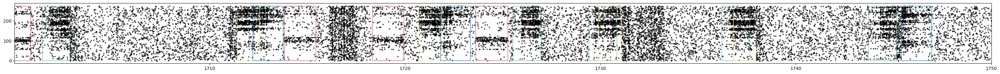

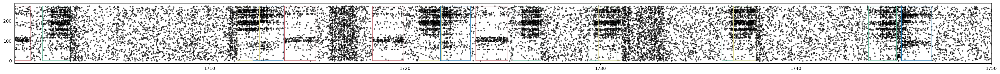

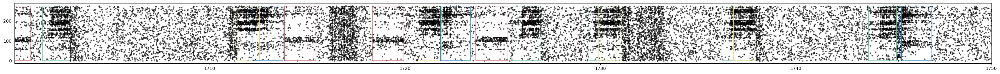

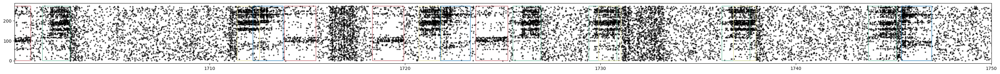

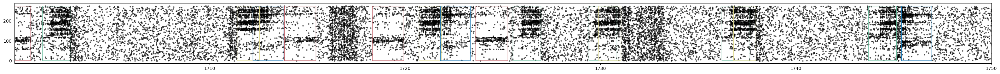

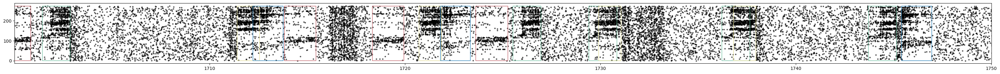

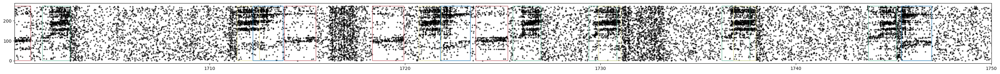

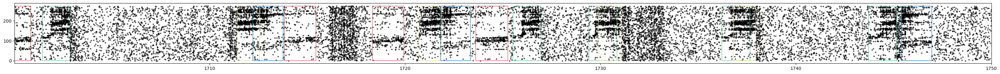

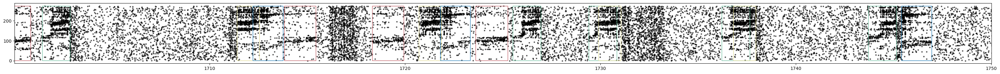

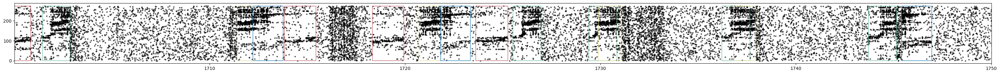

In [939]:
## load synthetic spikes:
# ben called these jsons but they are actually pickle files! 
js_file = r"Z:\projects\Benjamin\synthetic_analysis\\" + mouse_session_recording + "\synth_spikes\spike_shuffles.json"
spikes_dict = pd.read_pickle(js_file)
dict_keys = spikes_dict.keys()
### loop over each dict key, save out the data... do this for each synthetic data type etc. 
for modification_prcentage in dict_keys:
    spikes_df = spikes_dict[modification_prcentage]
    new_column_names = {0: 'neuron', 1: 'timestamp'}
    spikes_df.rename(columns=new_column_names, inplace=True)
    
    # plot and extract data
    ppseq_events, spikes_df, event_periods = plot_synthetic_spike_data(spikes_df,None,100,150,mouse_session_recording)
    
    #################### save out data to recreate this in the future if needed
    synthetic_file_type = 'disorered_spikes'
    synthetic_file_name = 'disorered_spikes_' + str(modification_prcentage)
    save_out_synthetic_data(synthetic_file_type,synthetic_file_name,ppseq_events, spikes_df, event_periods,mouse_session_recording)

##### noise insertion 

[[1600, 2200]]
[[1600, 2200]]
    • data '.txt' file saved to:          Z:\projects\Emmett\synthetic_data_rerun\prepared_data\148_2_2\148_2_2_background_noise_spikes_20.txt
    • parameters '.json' file saved to:   Z:\projects\Emmett\synthetic_data_rerun\prepared_data\148_2_2\params_148_2_2_background_noise_spikes_20.json
[[1600, 2200]]
[[1600, 2200]]
    • data '.txt' file saved to:          Z:\projects\Emmett\synthetic_data_rerun\prepared_data\148_2_2\148_2_2_background_noise_spikes_40.txt
    • parameters '.json' file saved to:   Z:\projects\Emmett\synthetic_data_rerun\prepared_data\148_2_2\params_148_2_2_background_noise_spikes_40.json
[[1600, 2200]]
[[1600, 2200]]
    • data '.txt' file saved to:          Z:\projects\Emmett\synthetic_data_rerun\prepared_data\148_2_2\148_2_2_background_noise_spikes_80.txt
    • parameters '.json' file saved to:   Z:\projects\Emmett\synthetic_data_rerun\prepared_data\148_2_2\params_148_2_2_background_noise_spikes_80.json
[[1600, 2200]]
[[1600, 2200]

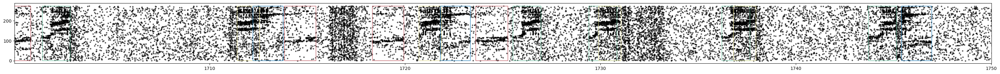

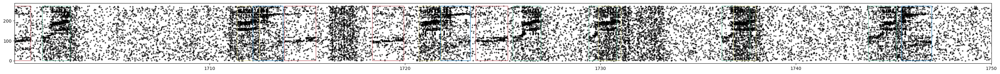

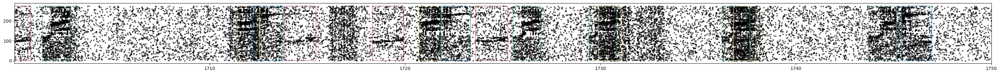

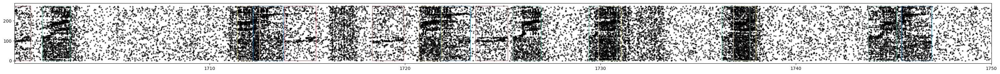

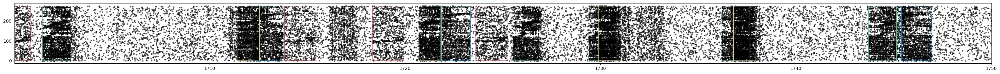

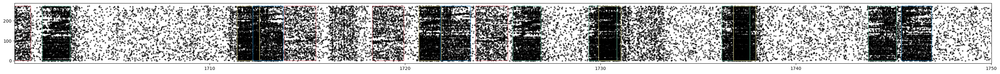

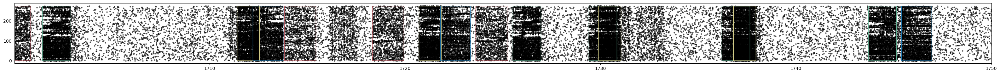

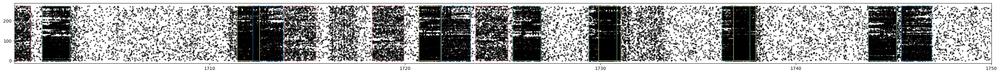

In [940]:
## load synthetic spikes:
# ben called these jsons but they are actually pickle files! 
js_file = r"Z:\projects\Benjamin\synthetic_analysis\\" + mouse_session_recording + "\synth_spikes\spike_noises.json"
spikes_dict = pd.read_pickle(js_file)
dict_keys = spikes_dict.keys()
### loop over each dict key, save out the data... do this for each synthetic data type etc. 
for modification_prcentage in dict_keys:
    spikes_df = spikes_dict[modification_prcentage]
    new_column_names = {0: 'neuron', 1: 'timestamp'}
    spikes_df.rename(columns=new_column_names, inplace=True)
    
    # plot and extract data
    ppseq_events, spikes_df, event_periods = plot_synthetic_spike_data(spikes_df,None,100,150,mouse_session_recording)
    
    #################### save out data to recreate this in the future if needed
    synthetic_file_type = 'background_noise_spikes'
    synthetic_file_name = 'background_noise_spikes_' + str(modification_prcentage)
    save_out_synthetic_data(synthetic_file_type,synthetic_file_name,ppseq_events, spikes_df, event_periods,mouse_session_recording)

##### warp

[[2300, 2900]]
adding 2 missing neurons
[[2300, 2900]]
    • data '.txt' file saved to:          Z:\projects\Emmett\synthetic_data_rerun\prepared_data\255_1_2\255_1_2_warp_spikes_30.txt
    • parameters '.json' file saved to:   Z:\projects\Emmett\synthetic_data_rerun\prepared_data\255_1_2\params_255_1_2_warp_spikes_30.json


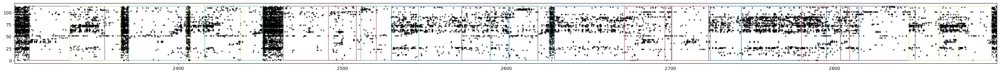

In [5]:
def delete_period(background_noise,period_):
    keep_delete_mask = np.logical_or(background_noise.permuted_spikes.values < period_[0], background_noise.permuted_spikes.values > period_[-1])
    background_noise = background_noise[keep_delete_mask]
    return background_noise

def find_missing_items(nums, end_value):
    missing_items = []

    for i in range(nums[0], end_value + 1):
        if i not in nums:
            missing_items.append(i)

    return missing_items

def stretch_or_compress_timeseries(orig,factor):
    sorted_index = np.argsort(orig)
    undo_sorting = [np.argsort(sorted_index)]
    
    sorted_orig = np.array(orig)[sorted_index]
    
    stretched = [sorted_orig[0]] + list(((sorted_orig[1::] - sorted_orig[0]) * factor) + sorted_orig[0])
    
    return(list(np.array(stretched)[undo_sorting][0]))

import random

def random_balanced_indices(arr, n):
    # Count occurrences of each unique value in the array
    value_counts = {value: arr.count(value) for value in set(arr)}

    # Calculate the number of repetitions needed for each value
    repetitions = {value: n // len(value_counts) for value in value_counts}

    # Generate indices for each value with repetitions
    indices = [random.choice([i for i, x in enumerate(arr) if x == value]) for value in value_counts for _ in range(repetitions[value])]

    # If n is larger than the total number of elements, randomly repeat indices
    while len(indices) < n:
        indices.append(random.choice(indices))

    # Trim the list to the desired length
    return indices[:n]

def spread_events_with_jitter(n, total_time, min_gap_between_events, min_gap_from_start, min_gap_from_end):
    while True:
        # Calculate the usable time range after removing start and end gaps
        usable_time = total_time - min_gap_from_start - min_gap_from_end

        # Calculate the mean distance between events
        mean_distance = usable_time / (n - 1)

        # Spread events evenly without jitter
        event_schedule = [min_gap_from_start + i * mean_distance for i in range(n)]

        # Introduce random jitter by half the mean distance between events
        jitter_range = int(mean_distance / 2)
        for i in range(n):
            jitter = random.randint(-jitter_range, jitter_range)
            event_schedule[i] += jitter

        # Check if any events violate constraints
        if all(min_gap_from_start <= event <= total_time - min_gap_from_end for event in event_schedule):
            return event_schedule
        
def plot_synthetic_spike_data_warp(spikes_df,event_periods,ppseq_events,x1,x2,mouse_session_recording):

    # for loading color and order data from awake alignment 
    region = 'striatum'
    saved_data_path = os.path.join("Z:\projects\sequence_squad\organised_data\ppseq_analysis\ppseq_awake_analysis\plots\\" + mouse_session_recording, region) + '\\'

    with open(os.path.join(os.path.join(PP_PATH,file) + r"\analysis_output\reordered_recolored\colors"), "rb") as input_file:
        colors = pickle.load(input_file)

    with open(os.path.join(os.path.join(PP_PATH,file) + r"\analysis_output\reordered_recolored\neuron_index"), "rb") as input_file:
        new_neuron_index = pickle.load(input_file)

    seq_types = ppseq_events.seq_type.values
    ###################

    new_neuron_permute_loc = np.zeros(len(new_neuron_index))
    for i in range(len(new_neuron_index)):
        new_neuron_permute_loc[i] = int(list(new_neuron_index).index(i))

    fig,ax= plt.subplots(1, 1,figsize=(40, 2.5))

    neuron_order_test = new_neuron_permute_loc[spikes_df.neuron.values.astype(int)-1]
    ax.scatter(spikes_df.timestamp.values, neuron_order_test ,marker = 'o', s=10, linewidth=0,color = 'black' ,alpha=0.7)

    rects = []
    for i,event in enumerate(event_periods):
        seq_type = seq_types[i]
        left = min(event)
        right = max(event)
        top = max(spikes_df.neuron)
        bottom = min(spikes_df.neuron)
        col_ = colors[int(seq_type)]
        rects +=  [Rectangle((left, bottom), right-left, top-bottom, linewidth=1, edgecolor=col_, facecolor='none') ]

    for rect in rects:
        ax.add_patch(rect)

    ax.set_xlim([min(spikes_df.timestamp) + x1,min(spikes_df.timestamp) + x2])
    
    return spikes_df, event_periods

warps = [0.03, 0.1,0.2,0.5,2,5,10,20,30]

warps = [30]
for warp in warps:

    chosen_number= 200
    min_gap_between_events=1
    min_gap_from_start=10
    min_gap_from_end=10
    if warp == 2:
        chosen_number = 100
        min_gap_between_events=2
        min_gap_from_start=10
        min_gap_from_end=10
    if warp == 5:
        chosen_number = 40
        min_gap_between_events=10
        min_gap_from_start=10
        min_gap_from_end=20
    if warp == 10:
        chosen_number = 35
        min_gap_between_events=15
        min_gap_from_start=10
        min_gap_from_end=30
    if warp == 20:
        chosen_number = 30
        min_gap_between_events=20
        min_gap_from_start=10
        min_gap_from_end=30
    if warp == 30:
        chosen_number = 20
        min_gap_between_events=120
        min_gap_from_start=5
        min_gap_from_end=30

    ### load synthetic spikes:
    # ben called these jsons but they are actually pickle files! 
    js_file = r"Z:\projects\Benjamin\synthetic_analysis\\" + mouse_session_recording + "\synth_spikes\spike_synth.json"
    spikes_df = pd.read_pickle(js_file)
    new_column_names = {0: 'neuron', 1: 'timestamp'}
    spikes_df.rename(columns=new_column_names, inplace=True)

    # load in events
    ########## adapted from bens code: I think it orders the seq types by their spike times ordering
    brain_state = "awake" # name of prepare_data file output 
    recording_dir_awake = "Z:/projects/sequence_squad/organised_data/ppseq_data/finalised_output/striatum/" + brain_state + "/" 
    for item in os.listdir(recording_dir_awake):
        if mouse_session_recording in item:
            mouse_dat_file = item
    recording_dir_awake= recording_dir_awake + mouse_dat_file

    prepared_spikes_dir = os.path.join(recording_dir_awake,"trainingData/" + mouse_session_recording)
    spike_file = os.path.join(prepared_spikes_dir + ".txt")
    spike_json_file = os.path.join(recording_dir_awake,"trainingData/params_"+mouse_session_recording+".json")

    spike_json = json.load(open(spike_json_file))

    print(spike_json["time_span"])
    time_spans = spike_json["time_span"]

    ppseq_events = pd.read_pickle("Z:/projects/sequence_squad/organised_data/ppseq_analysis/synthetic_data/"+mouse_session_recording+"/striatum/all_extracted_spike_profiles")

    event_periods = np.zeros((len(ppseq_events),2))
    for event in range(len(ppseq_events)):
        event_periods[event,0] = ppseq_events["spike_profiles"][event].timestamp.min()
        event_periods[event,1] = ppseq_events["spike_profiles"][event].timestamp.max()
    event_sorted_idx = np.argsort(event_periods, 0)[:,0]
    event_periods = np.sort(event_periods, 0)
    event_periods = event_periods + time_spans[0][0]
    ppseq_events = ppseq_events.loc[event_sorted_idx] # sorted according to time periods
    ppseq_events.reset_index(inplace=True) # sorted according to time periods
    seq_types = ppseq_events.seq_type.values
    ###################


    # chose inds
    chosen_inds = random_balanced_indices(list(ppseq_events.seq_type.values),chosen_number)
    random.shuffle(chosen_inds)
    chosen_events = event_periods[chosen_inds]
    chosen_event_seq_labels = ppseq_events.seq_type.values[chosen_inds]

    ## where to put them in the noise 
    n_events = chosen_number #desired number of events
    total_time = 600  # Total time in seconds
    event_schedule = spread_events_with_jitter(n_events, total_time,min_gap_between_events,min_gap_from_start,min_gap_from_end)

    profiles  = []
    event_periods = []
    for index,period in enumerate(chosen_events):
        holdout_mask = (spikes_df.timestamp.values >= period[0]) * (spikes_df.timestamp.values <= period[-1])
        implant_spikes_df = spikes_df[holdout_mask]
        implant_spikes_df =  implant_spikes_df.reset_index(drop=True)
        implant_spikes_df['warped'] = stretch_or_compress_timeseries(implant_spikes_df.timestamp.values,warp)
        implant_spikes_df['warped_scheduled'] = (implant_spikes_df.warped.values - min(implant_spikes_df.warped.values)) + event_schedule[index]
        inserted_profile = pd.DataFrame({'neuron':implant_spikes_df.neuron.values,'timestamp':implant_spikes_df.warped_scheduled.values})
        profiles += [inserted_profile]
        event_periods += [[min(inserted_profile.timestamp),max(inserted_profile.timestamp)]]

    ppseq_events = pd.DataFrame({'seq_type':chosen_event_seq_labels,'inserted_profile':profiles})
    event_periods = np.array(event_periods)

    #### background noise deletion 
    background_noise = pd.read_pickle("Z:/projects/sequence_squad/organised_data/ppseq_analysis/synthetic_data/"+mouse_session_recording+"/striatum/" + 'permuted_spikes_df')
    # delete patches from background noise
    for i,period in enumerate(event_periods):
        period_ = np.array(period)
        if i == 0:
            deleted_noise = delete_period(background_noise,period_)
        else:
            deleted_noise = delete_period(deleted_noise,period_)


    # add in warped spikes:
    spikes_ = []
    neurons_ = []
    for event in range(len(ppseq_events)):
        spikes_ += list(ppseq_events.inserted_profile[event].timestamp.values) 
        neurons_ += list(ppseq_events.inserted_profile[event].neuron.values) 
    spikes = spikes_ + list(deleted_noise.permuted_spikes.values)
    neurons = neurons_ + list(deleted_noise.permuted_neurons.values)
    # convert back to origonal ephsy time to work with function
    spikes = np.array(spikes) + time_spans[0][0]
    event_periods = event_periods + time_spans[0][0]

    spikes_df = pd.DataFrame({'neuron':neurons,'timestamp':spikes})


    # sometimes during the deletion neurons go missing for good, add them back in at the start so that ppseq doesnt break 
    current_total = len(spikes_df.neuron.unique())
    correct_total = len(background_noise.permuted_neurons.unique())
    if current_total < correct_total:
        print('adding ' + str(correct_total - current_total) + ' missing neurons' )
        missing_items = find_missing_items(spikes_df.neuron.unique().astype(int),correct_total)
        new_df = pd.DataFrame({'neuron':missing_items,'timestamp':len(missing_items)*[min(spikes_df.timestamp)]})
        spikes_df = pd.concat([spikes_df,new_df],ignore_index = True)

    # plot and extract data
    spikes_df, event_periods = plot_synthetic_spike_data_warp(spikes_df,event_periods,ppseq_events,1,600,mouse_session_recording)

    #################### save out data to recreate this in the future if needed
    synthetic_file_type = 'warp_spikes'
    synthetic_file_name = 'warp_spikes_' + str(warp)
    save_out_synthetic_data(synthetic_file_type,synthetic_file_name,ppseq_events, spikes_df, event_periods,mouse_session_recording)

In [10]:
len(spikes_df.neuron.unique())

114

In [587]:
## load synthetic spikes:
# ben called these jsons but they are actually pickle files! 
js_file = r"Z:\projects\Benjamin\synthetic_analysis\\" + mouse_session_recording + "\synth_spikes\spike_synth.json"
spikes_df = pd.read_pickle(js_file)
new_column_names = {0: 'neuron', 1: 'timestamp'}
spikes_df.rename(columns=new_column_names, inplace=True)

# ppseq_events, spikes_df, event_periods = plot_synthetic_spike_data(spikes_df,None,0,100,mouse_session_recording)

# #################### save out data to recreate this in the future if needed
# synthetic_file_type = 'standard_insertion'
# save_out_synthetic_data(synthetic_file_type,synthetic_file_type,ppseq_events, spikes_df, event_periods,mouse_session_recording)

In [590]:
# load in events
########## adapted from bens code: I think it orders the seq types by their spike times ordering
brain_state = "awake" # name of prepare_data file output 
recording_dir_awake = "Z:/projects/sequence_squad/organised_data/ppseq_data/finalised_output/striatum/" + brain_state + "/" 
for item in os.listdir(recording_dir_awake):
    if mouse_session_recording in item:
        mouse_dat_file = item
recording_dir_awake= recording_dir_awake + mouse_dat_file

prepared_spikes_dir = os.path.join(recording_dir_awake,"trainingData/" + mouse_session_recording)
spike_file = os.path.join(prepared_spikes_dir + ".txt")
spike_json_file = os.path.join(recording_dir_awake,"trainingData/params_"+mouse_session_recording+".json")

spike_json = json.load(open(spike_json_file))

print(spike_json["time_span"])
time_spans = spike_json["time_span"]

ppseq_events = pd.read_pickle("Z:/projects/sequence_squad/organised_data/ppseq_analysis/synthetic_data/"+mouse_session_recording+"/striatum/all_extracted_spike_profiles")

event_periods = np.zeros((len(ppseq_events),2))
for event in range(len(ppseq_events)):
    event_periods[event,0] = ppseq_events["spike_profiles"][event].timestamp.min()
    event_periods[event,1] = ppseq_events["spike_profiles"][event].timestamp.max()
event_sorted_idx = np.argsort(event_periods, 0)[:,0]
event_periods = np.sort(event_periods, 0)
event_periods = event_periods + time_spans[0][0]
ppseq_events = ppseq_events.loc[event_sorted_idx] # sorted according to time periods
ppseq_events.reset_index(inplace=True) # sorted according to time periods
seq_types = ppseq_events.seq_type.values
###################

[[8200, 8800]]


[[8200, 8800]]
    • data '.txt' file saved to:          Z:\projects\Emmett\synthetic_data_rerun\prepared_data\178_2_2\178_2_2_warp_spikes_0.03.txt
    • parameters '.json' file saved to:   Z:\projects\Emmett\synthetic_data_rerun\prepared_data\178_2_2\params_178_2_2_warp_spikes_0.03.json


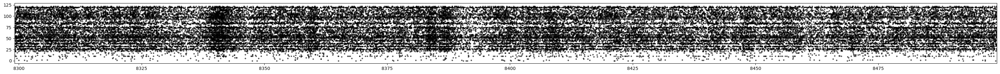

In [764]:


# this section of code loads stuff and creates a new spikes_df file and event periods because bens one was broken 
brain_state = "awake" # name of prepare_data file output 
recording_dir_awake = "Z:/projects/sequence_squad/organised_data/ppseq_data/finalised_output/striatum/" + brain_state + "/" 
for item in os.listdir(recording_dir_awake):
    if mouse_session_recording in item:
        mouse_dat_file = item
recording_dir_awake= recording_dir_awake + mouse_dat_file
spike_json_file = os.path.join(recording_dir_awake,"trainingData/params_"+mouse_session_recording+".json")
spike_json = json.load(open(spike_json_file))
time_spans = spike_json["time_span"]
        
# add in warped spikes:
spikes_ = []
neurons_ = []
for event in range(len(ppseq_events)):
    spikes_ += list(ppseq_events.inserted_profile[event].timestamp.values) 
    neurons_ += list(ppseq_events.inserted_profile[event].neuron.values) 
spikes = spikes_ + list(deleted_noise.permuted_spikes.values)
neurons = neurons_ + list(deleted_noise.permuted_neurons.values)
# convert back to origonal ephsy time to work with function
spikes = np.array(spikes) + time_spans[0][0]
event_periods = event_periods + time_spans[0][0]

spikes_df = pd.DataFrame({'neuron':neurons,'timestamp':spikes})

# sometimes during the deletion neurons go missing for good, add them back in at the start so that ppseq doesnt break 
current_total = len(spikes_df.neuron.unique())
correct_total = len(background_noise.permuted_neurons.unique())
if current_total < correct_total:
    print('adding ' + str(correct_total - current_total) + ' missing neurons' )
    missing_items = find_missing_items(spikes_df.neuron.unique().astype(int),correct_total)
    new_df = pd.DataFrame({'neuron':missing_items,'timestamp':len(missing_items)*[min(spikes_df.timestamp)]})
    spikes_df = pd.concat([spikes_df,new_df],ignore_index = True)

#########

# plot and extract data
spikes_df, event_periods = plot_synthetic_warp(spikes_df,event_periods,100,300,mouse_session_recording)

#################### save out data to recreate this in the future if needed
synthetic_file_type = 'warp_spikes'
synthetic_file_name = 'warp_spikes_' + str(modification_prcentage)
save_out_synthetic_data(synthetic_file_type,synthetic_file_name,ppseq_events, spikes_df, event_periods,mouse_session_recording)
    

In [742]:
profiles

[     neuron  timestamp
 0         1   17.33012
 1         1   17.34254
 2         3   17.32778
 3         3   17.35757
 4         7   17.39996
 ..      ...        ...
 208     121   17.23940
 209     122   17.03474
 210     122   17.23580
 211     122   17.78993
 212     122   17.80703
 
 [213 rows x 2 columns],
      neuron  timestamp
 0         2  40.294318
 1         4  40.540828
 2         7  40.082368
 3         7  40.753138
 4         8  40.139068
 ..      ...        ...
 215     116  40.031158
 216     116  40.051498
 217     116  40.098388
 218     116  40.357138
 219     117  40.096948
 
 [220 rows x 2 columns],
     neuron  timestamp
 0        2  80.465247
 1        7  80.076897
 2        7  80.256717
 3        7  80.373087
 4        7  80.419797
 ..     ...        ...
 71     121  80.102907
 72     121  80.128017
 73     121  80.148627
 74     121  80.426367
 75     121  80.525457
 
 [76 rows x 2 columns],
      neuron   timestamp
 0         2  110.846245
 1         2  111.

In [751]:
ppseq_events.inserted_profile[0]

,neuron,timestamp
0,1,17.33012
1,1,17.34254
2,3,17.32778
3,3,17.35757
4,7,17.39996
...,...,...
208,121,17.23940
209,122,17.03474
210,122,17.23580
211,122,17.78993


In [738]:
inserted_profile = pd.DataFrame({'neuron':implant_spikes_df.neuron.values,'timestamp':implant_spikes_df.warped_scheduled.values)

In [739]:
inserted_profile

,neuron,timestamp
0,2.0,34.722
1,4.0,31.728
2,7.0,24.954
3,8.0,28.611
4,8.0,38.649
...,...,...
162,122.0,37.251
163,122.0,37.515
164,122.0,39.312
165,122.0,42.489


In [ ]:
implant_spikes_df

In [736]:
ppseq_events.inserted_profile[0]

,neuron,timestamp,sequence_type,seq_confidence,sequence_type_adjusted
833,2,275.694037,5.0,0.47,-1.0
2190,4,275.690512,2.0,0.86,2.0
2191,4,275.690914,2.0,0.85,2.0
2192,4,275.691046,2.0,0.91,2.0
2193,4,275.700766,2.0,0.73,-1.0
...,...,...,...,...,...
132131,115,275.703160,5.0,0.74,-1.0
132132,115,275.706013,5.0,0.68,-1.0
136146,116,275.706526,5.0,0.86,5.0
140438,117,275.703337,2.0,0.82,2.0


In [733]:
implant_spikes_df

,neuron,timestamp,warped,warped_scheduled
0,2.0,8515.8707,8526.2353,34.722
1,4.0,8515.7709,8523.2413,31.728
2,7.0,8515.5451,8516.4673,24.954
3,8.0,8515.6670,8520.1243,28.611
4,8.0,8516.0016,8530.1623,38.649
...,...,...,...,...
162,122.0,8515.9550,8528.7643,37.251
163,122.0,8515.9638,8529.0283,37.515
164,122.0,8516.0237,8530.8253,39.312
165,122.0,8516.1296,8534.0023,42.489


In [ ]:
### turn these into the things I used before...

In [732]:
chosen_event_seq_labels

array([5., 2., 5., 2., 4., 6., 5., 4., 6., 2., 6., 4., 6., 6., 5., 5., 4.,
       2., 4., 2.])

In [633]:
event_periodschosen_warp_inds

[]

In [622]:
implant_spikes_df

,neuron,timestamp
0,1.0,8797.6510
1,1.0,8797.7573
2,2.0,8798.2986
3,4.0,8797.4959
4,4.0,8797.8723
...,...,...
186,122.0,8797.9694
187,122.0,8798.0199
188,122.0,8798.1444
189,122.0,8798.2673


warp file found:warp_insertion0.03_spike_profiles_2023-11-28
[[8200, 8800]]
    • data '.txt' file saved to:          Z:\projects\Emmett\synthetic_data_rerun\prepared_data\178_2_2\178_2_2_warp_spikes_0.03.txt
    • parameters '.json' file saved to:   Z:\projects\Emmett\synthetic_data_rerun\prepared_data\178_2_2\params_178_2_2_warp_spikes_0.03.json


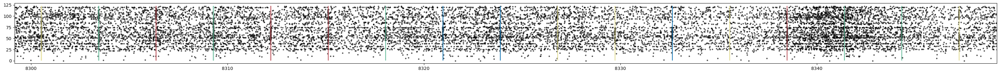

In [747]:
        


def plot_synthetic_warp(spikes_df,event_periods,x1,x2,mouse_session_recording):

    # for loading color and order data from awake alignment 
    region = 'striatum'
    saved_data_path = os.path.join("Z:\projects\sequence_squad\organised_data\ppseq_analysis\ppseq_awake_analysis\plots\\" + mouse_session_recording, region) + '\\'

    with open(os.path.join(os.path.join(PP_PATH,file) + r"\analysis_output\reordered_recolored\colors"), "rb") as input_file:
        colors = pickle.load(input_file)

    with open(os.path.join(os.path.join(PP_PATH,file) + r"\analysis_output\reordered_recolored\neuron_index"), "rb") as input_file:
        new_neuron_index = pickle.load(input_file)

    new_neuron_permute_loc = np.zeros(len(new_neuron_index))
    for i in range(len(new_neuron_index)):
        new_neuron_permute_loc[i] = int(list(new_neuron_index).index(i))

    fig,ax= plt.subplots(1, 1,figsize=(40, 2.5))

    neuron_order_test = new_neuron_permute_loc[spikes_df.neuron.values.astype(int)-1]
    ax.scatter(spikes_df.timestamp.values, neuron_order_test ,marker = 'o', s=10, linewidth=0,color = 'black' ,alpha=0.7)

    rects = []
    for i,event in enumerate(event_periods):
        seq_type = seq_types[i]
        left = min(event)
        right = max(event)
        top = max(spikes_df.neuron)
        bottom = min(spikes_df.neuron)
        col_ = colors[int(seq_type)]
        rects +=  [Rectangle((left, bottom), right-left, top-bottom, linewidth=1, edgecolor=col_, facecolor='none') ]

    for rect in rects:
        ax.add_patch(rect)

    ax.set_xlim([min(spikes_df.timestamp) + x1,min(spikes_df.timestamp) + x2])
    
    return spikes_df, event_periods



## load synthetic spikes:
# ben called these jsons but they are actually pickle files! 
js_file = r"Z:\projects\Benjamin\synthetic_analysis\\" + mouse_session_recording + "\synth_spikes\spike_warps.json"
spikes_dict = pd.read_pickle(js_file)
dict_keys = spikes_dict.keys()
  
### loop over each dict key, save out the data... do this for each synthetic data type etc. 
for modification_prcentage in dict_keys:
    
    for item in os.listdir("Z:/projects/sequence_squad/organised_data/ppseq_analysis/synthetic_data/"+mouse_session_recording+"/striatum/"):
        if 'warp' in item:
            if str(modification_prcentage) in item.split('_')[1]:
                print('warp file found:' + item)
                ppseq_events = pd.read_pickle("Z:/projects/sequence_squad/organised_data/ppseq_analysis/synthetic_data/"+mouse_session_recording+"/striatum/" + item)
                break
         
    
    ########
    # this section of code loads stuff and creates a new spikes_df file and event periods because bens one was broken 
    brain_state = "awake" # name of prepare_data file output 
    recording_dir_awake = "Z:/projects/sequence_squad/organised_data/ppseq_data/finalised_output/striatum/" + brain_state + "/" 
    for item in os.listdir(recording_dir_awake):
        if mouse_session_recording in item:
            mouse_dat_file = item
    recording_dir_awake= recording_dir_awake + mouse_dat_file
    spike_json_file = os.path.join(recording_dir_awake,"trainingData/params_"+mouse_session_recording+".json")
    spike_json = json.load(open(spike_json_file))
    time_spans = spike_json["time_span"]
        
    event_periods = np.zeros((len(ppseq_events),2))
    for event in range(len(ppseq_events)):
        try:
            event_periods[event,0] = ppseq_events["inserted_profile"][event].timestamp.min()
            event_periods[event,1] = ppseq_events["inserted_profile"][event].timestamp.max()
        except:
            event_periods[event,0] = ppseq_events["spike_profiles"][event].timestamp.min()
            event_periods[event,1] = ppseq_events["spike_profiles"][event].timestamp.max()
            

    background_noise = pd.read_pickle("Z:/projects/sequence_squad/organised_data/ppseq_analysis/synthetic_data/"+mouse_session_recording+"/striatum/" + 'permuted_spikes_df')
    # delete patches from background noise
    for i,period in enumerate(event_periods):
        period_ = np.array(period)
        if i == 0:
            deleted_noise = delete_period(background_noise,period_)
        else:
            deleted_noise = delete_period(deleted_noise,period_)
  
    # add in warped spikes:
    spikes_ = []
    neurons_ = []
    for event in range(len(ppseq_events)):
        spikes_ += list(ppseq_events.inserted_profile[event].timestamp.values) 
        neurons_ += list(ppseq_events.inserted_profile[event].neuron.values) 
    spikes = spikes_ + list(deleted_noise.permuted_spikes.values)
    neurons = neurons_ + list(deleted_noise.permuted_neurons.values)
    # convert back to origonal ephsy time to work with function
    spikes = np.array(spikes) + time_spans[0][0]
    event_periods = event_periods + time_spans[0][0]
    
    spikes_df = pd.DataFrame({'neuron':neurons,'timestamp':spikes})

    # sometimes during the deletion neurons go missing for good, add them back in at the start so that ppseq doesnt break 
    current_total = len(spikes_df.neuron.unique())
    correct_total = len(background_noise.permuted_neurons.unique())
    if current_total < correct_total:
        print('adding ' + str(correct_total - current_total) + ' missing neurons' )
        missing_items = find_missing_items(spikes_df.neuron.unique().astype(int),correct_total)
        new_df = pd.DataFrame({'neuron':missing_items,'timestamp':len(missing_items)*[min(spikes_df.timestamp)]})
        spikes_df = pd.concat([spikes_df,new_df],ignore_index = True)
    
    #########
    
    # plot and extract data
    spikes_df, event_periods = plot_synthetic_warp(spikes_df,event_periods,100,150,mouse_session_recording)
    
    #################### save out data to recreate this in the future if needed
    synthetic_file_type = 'warp_spikes'
    synthetic_file_name = 'warp_spikes_' + str(modification_prcentage)
    save_out_synthetic_data(synthetic_file_type,synthetic_file_name,ppseq_events, spikes_df, event_periods,mouse_session_recording)
    
    break
    



In [584]:
#### warp is still broken:
# warps seem wrong and im not implanting full periods - still just patches. 
# i think i might need to make it from scratch - using bens implanted seqs from above...

In [727]:
spikes_df

,neuron,timestamp
0,2,8475.694037
1,4,8475.690512
2,4,8475.690914
3,4,8475.691046
4,4,8475.700766
...,...,...
175046,78,8779.223710
175047,21,8780.794322
175048,49,8781.246176
175049,102,8787.990283


In [728]:
spikes_df
event_periods

array([[8475.68341709, 8475.71178809],
       [8472.7638191 , 8472.7918061 ],
       [8563.27135678, 8563.29941578],
       [8382.25628141, 8382.28440941],
       [8621.66331658, 8621.69169058],
       [8367.65829146, 8367.68663546],
       [8630.42211055, 8630.45057755],
       [8776.40201005, 8776.42966105],
       [8315.10552764, 8315.13390464],
       [8542.83417085, 8542.86225385],
       [8490.28140704, 8490.30975104],
       [8665.45728643, 8665.48551343],
       [8402.69346734, 8402.72166434],
       [8426.05025126, 8426.07857126],
       [8259.63316583, 8259.66156983],
       [8624.58291457, 8624.61079357],
       [8499.04020101, 8499.06819401],
       [8326.7839196 , 8326.8104546 ],
       [8385.1758794 , 8385.2041934 ],
       [8741.36683417, 8741.39489917],
       [8586.6281407 , 8586.6562597 ],
       [8703.4120603 , 8703.4398043 ],
       [8297.5879397 , 8297.6161847 ],
       [8566.19095477, 8566.21938277],
       [8364.73869347, 8364.76712747],
       [8513.63819095, 85

In [731]:
ppseq_events.inserted_profile[0]

,neuron,timestamp,sequence_type,seq_confidence,sequence_type_adjusted
833,2,275.694037,5.0,0.47,-1.0
2190,4,275.690512,2.0,0.86,2.0
2191,4,275.690914,2.0,0.85,2.0
2192,4,275.691046,2.0,0.91,2.0
2193,4,275.700766,2.0,0.73,-1.0
...,...,...,...,...,...
132131,115,275.703160,5.0,0.74,-1.0
132132,115,275.706013,5.0,0.68,-1.0
136146,116,275.706526,5.0,0.86,5.0
140438,117,275.703337,2.0,0.82,2.0
